<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/5/58/Uber_logo_2018.svg/1024px-Uber_logo_2018.svg.png" alt="UBER LOGO" width="50%" />

# UBER Pickups 

## Company's Description 📇

<a href="http://uber.com/" target="_blank">Uber</a> is one of the most famous startup in the world. It started as a ride-sharing application for people who couldn't afford a taxi. Now, Uber expanded its activities to Food Delivery with <a href="https://www.ubereats.com/fr-en" target="_blank">Uber Eats</a>, package delivery, freight transportation and even urban transportation with <a href="https://www.uber.com/fr/en/ride/uber-bike/" target="_blank"> Jump Bike</a> and <a href="https://www.li.me/" target="_blank"> Lime </a> that the company funded. 


The company's goal is to revolutionize transportation accross the globe. It operates now on about 70 countries and 900 cities and generates over $14 billion revenue! 😮


## Goals 🎯

Uber already has data about pickups in major cities. Your objective is to create algorithms that will determine where are the hot-zones that drivers should be in. Therefore you will:

* Create an algorithm to find hot zones 
* Visualize results on a nice dashboard 

## Scope of this project 🖼️

To start off, Uber wants to try this feature in New York city. Therefore you will only focus on this city. Data can be found here: 

👉👉<a href="https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+non+Supervis%C3%A9/Projects/uber-trip-data.zip" target="_blank"> Uber Trip Data</a> 👈👈

**You only need to focus on New York City for this project**

## Helpers 🦮

To help you achieve this project, here are a few tips that should help you: 

### Clustering is your friend 

Clustering technics are a perfect fit for the job. Think about it, all the pickup locations can be gathered into different clusters. You can then use **cluster coordinates to pin hot zones** 😉
    

### Create maps with `plotly` 

Check out <a href="https://plotly.com/" target="_blank">Plotly</a> documentation, you can create maps and populate them easily. Obviously, there are other libraries but this one should do the job pretty well. 


### Start small grow big 

Eventhough Uber wants to have hot-zones per hour and per day of week, you should first **start small**. Pick one day at a given hour and **then start to generalize** your approach. 

## Deliverable 📬

To complete this project, your team should: 

* Have a map with hot-zones using any python library (`plotly` or anything else). 
* You should **at least** describe hot-zones per day of week. 
* Compare results with **at least** two unsupervised algorithms like KMeans and DBScan. 

Your maps should look something like this: 

<img src="https://full-stack-assets.s3.eu-west-3.amazonaws.com/images/Clusters_uber_pickups.png" alt="Uber Cluster Map" />

## 📂 1.   Data Collection & Merging

In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.io as pio
import plotly.graph_objects as go
pio.renderers.default = "png"

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, DBSCAN



In [3]:


# set files path
apr14 = "/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/Data 2014/uber-raw-data-apr14.csv"
may14 = "/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/Data 2014/uber-raw-data-may14.csv"
jun14 = "/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/Data 2014/uber-raw-data-jun14.csv"
jul14 = "/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/Data 2014/uber-raw-data-jul14.csv"
aug14 = "/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/Data 2014/uber-raw-data-aug14.csv"
sep14 = "/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/Data 2014/uber-raw-data-sep14.csv"

print("*** Merging multiple csv files into a single pandas dataframe ***")

# merge files
df = pd.concat(map(pd.read_csv, [apr14, may14, jun14, jul14, aug14, sep14]), ignore_index=True)
print(df)

*** Merging multiple csv files into a single pandas dataframe ***
                  Date/Time      Lat      Lon    Base
0          4/1/2014 0:11:00  40.7690 -73.9549  B02512
1          4/1/2014 0:17:00  40.7267 -74.0345  B02512
2          4/1/2014 0:21:00  40.7316 -73.9873  B02512
3          4/1/2014 0:28:00  40.7588 -73.9776  B02512
4          4/1/2014 0:33:00  40.7594 -73.9722  B02512
...                     ...      ...      ...     ...
4534322  9/30/2014 22:57:00  40.7668 -73.9845  B02764
4534323  9/30/2014 22:57:00  40.6911 -74.1773  B02764
4534324  9/30/2014 22:58:00  40.8519 -73.9319  B02764
4534325  9/30/2014 22:58:00  40.7081 -74.0066  B02764
4534326  9/30/2014 22:58:00  40.7140 -73.9496  B02764

[4534327 rows x 4 columns]


EDA(Exploratory Data Analysis)

In [4]:
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


Upload the data from 2015 & taxi-zone-lookup to look for similarities (find common variables)

In [5]:
df_1 = pd.read_csv ('/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/uber-raw-data-janjune-15.csv')
df_1.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [6]:
df_2 = pd.read_csv('/Users/wafazeghouane/Desktop/Data_science_Full stack/Final projects/Uber/taxi-zone-lookup.csv')
df_2.head()

,LocationID,Borough,Zone
0,1,EWR,Newark Airport
1,2,Queens,Jamaica Bay
2,3,Bronx,Allerton/Pelham Gardens
3,4,Manhattan,Alphabet City
4,5,Staten Island,Arden Heights


Base : The TLC base company code affiliated with the Uber pickup.

In [7]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [8]:
df.shape

(4534327, 4)

In [9]:
df.describe(include="all")

,Date/Time,Lat,Lon,Base
count,4534327,4.534327e+06,4.534327e+06,4534327
unique,260093,NaN,NaN,5
top,4/7/2014 20:21:00,NaN,NaN,B02617
freq,97,NaN,NaN,1458853
mean,NaN,4.073926e+01,-7.397302e+01,NaN
std,NaN,3.994991e-02,5.726670e-02,NaN
min,NaN,3.965690e+01,-7.492900e+01,NaN
25%,NaN,4.072110e+01,-7.399650e+01,NaN
50%,NaN,4.074220e+01,-7.398340e+01,NaN
75%,NaN,4.076100e+01,-7.396530e+01,NaN


In [10]:
df.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

## 🧹 2. Data Cleaning & Preprocessing

Transform data/time to hour, day of week month and day

In [11]:
df['Date/Time'] = pd.to_datetime(df['Date/Time'])
df['hour'] = df['Date/Time'].dt.hour
df['month'] = df['Date/Time'].dt.month
df['day'] = df['Date/Time'].dt.day
df['dayofweek'] = df['Date/Time'].dt.day_name()


In [12]:
df.tail()

,Date/Time,Lat,Lon,Base,hour,month,day,dayofweek
4534322,2014-09-30 22:57:00,40.7668,-73.9845,B02764,22,9,30,Tuesday
4534323,2014-09-30 22:57:00,40.6911,-74.1773,B02764,22,9,30,Tuesday
4534324,2014-09-30 22:58:00,40.8519,-73.9319,B02764,22,9,30,Tuesday
4534325,2014-09-30 22:58:00,40.7081,-74.0066,B02764,22,9,30,Tuesday
4534326,2014-09-30 22:58:00,40.7140,-73.9496,B02764,22,9,30,Tuesday


In [13]:
df.head()

,Date/Time,Lat,Lon,Base,hour,month,day,dayofweek
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,0,4,1,Tuesday
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,0,4,1,Tuesday
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,0,4,1,Tuesday
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,0,4,1,Tuesday
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,0,4,1,Tuesday


In [14]:
df.nunique()

Date/Time    260093
Lat            7092
Lon           11453
Base              5
hour             24
month             6
day              31
dayofweek         7
dtype: int64

In [15]:
df.info(10)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534327 entries, 0 to 4534326
Data columns (total 8 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date/Time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
 4   hour       int32         
 5   month      int32         
 6   day        int32         
 7   dayofweek  object        
dtypes: datetime64[ns](1), float64(2), int32(3), object(2)
memory usage: 224.9+ MB


## 👁️ 3. Exploratory Data Analysis (EDA)

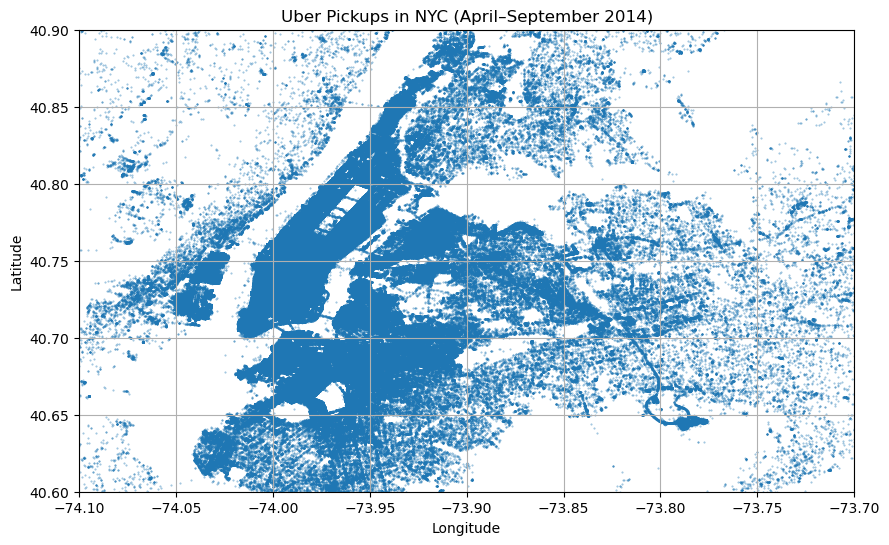

In [16]:
# Visualize Pickup Locations
#A simple scatter plot of all pickups in NYC.
#scatter plots of latitude and longitude to get an idea of distribution.

plt.figure(figsize=(10, 6))
plt.scatter(df['Lon'], df['Lat'], s=0.2, alpha=0.5)
plt.title('Uber Pickups in NYC (April–September 2014)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-74.1, -73.7)
plt.ylim(40.6, 40.9)
plt.grid(True)
plt.show()

#s=0.2, which makes each point tiny and easier to visualize as a pattern or cloud

 The central region has the highest concentration of pickups, indicating a high demand for rides in that area.
Pickups extend outward but become less frequent.
A few points are scattered far from the main clusters, representing low-demand areas.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.



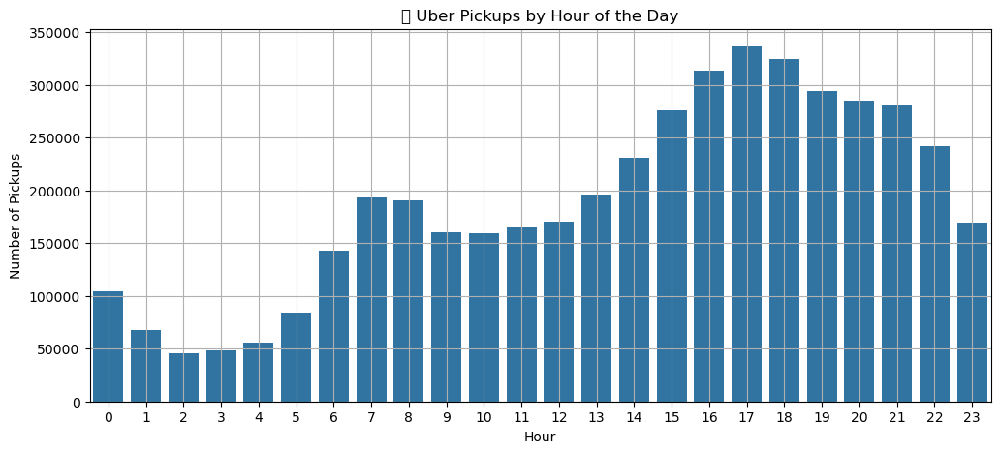

In [17]:
# Pickup Volume by Hour of Day

plt.figure(figsize=(12, 5))
sns.countplot(x='hour', data=df,)
plt.title('📈 Uber Pickups by Hour of the Day')
plt.xlabel('Hour')
plt.ylabel('Number of Pickups')
plt.grid(True)
plt.show()


Uber demand really starts picking up in the afternoon and stays high well into the evening.
The busiest time of day is clearly between 3 PM and 10 PM, with a peak around 5–6 PM — probably when people are leaving work, heading to dinner, or going out for the evening.

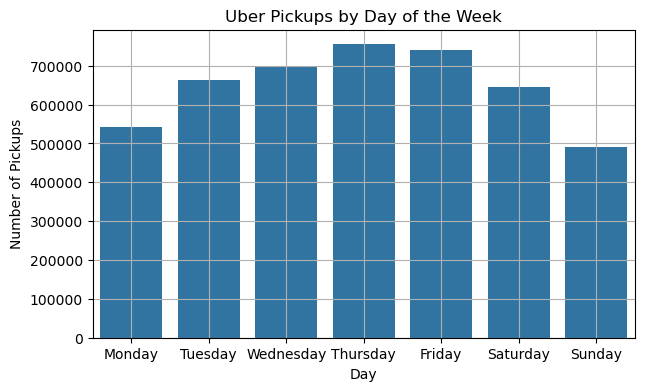

In [18]:
# Pickups by Day of the Week

plt.figure(figsize=(7, 4))

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(x='dayofweek', data=df, order=order)

plt.title('Uber Pickups by Day of the Week')
plt.xlabel('Day')
plt.ylabel('Number of Pickups')
plt.grid(True)
plt.show()




Thursday is the busiest day of the week for Uber pickups — even more than Friday or Saturday.
This could reflect a mix of commuting, evening events...
Sunday, on the other hand, shows the lowest demand, likely due to fewer outings or travel routines.

It visualizes Uber pickups in NYC, where each point represents a pickup location. The color indicates the hour of the day, with blue representing early hours (midnight to morning) and red representing later hours (afternoon to evening). We can observe a concentration of pickups in central areas. Red clusters in the late afternoon and evening indicate peak ride demand.

/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.



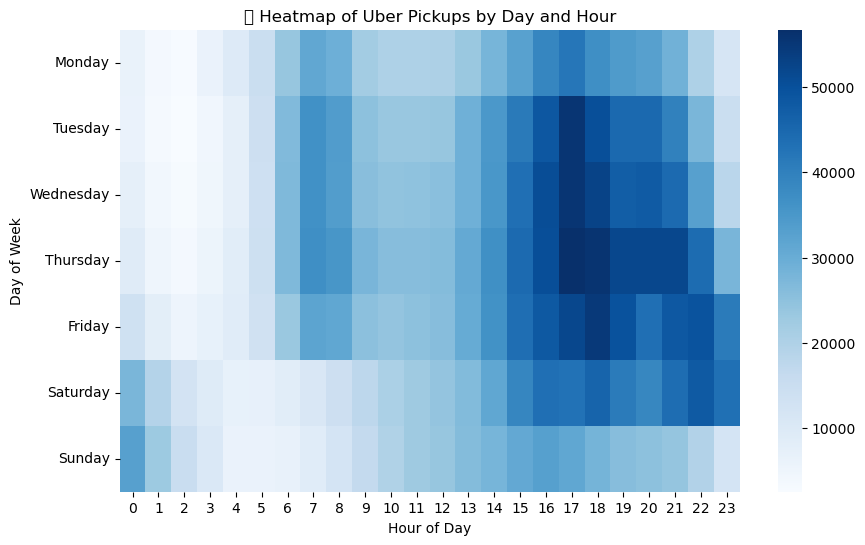

In [19]:
# Heatmap of Pickups by Day of Week and Hour

# Create pivot table: days as rows, hours as columns
heatmap_data = df.pivot_table(index='dayofweek', columns='hour', values='Lat', aggfunc='count')

# Reorder days correctly
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
heatmap_data = heatmap_data.reindex(days_order)

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='Blues' )
plt.title('🔥 Heatmap of Uber Pickups by Day and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()


Thursday between 3 PM and 10 PM is the hottest window for Uber activity in NYC

## 📍 4. Hot Zone Detection with Clustering

In [20]:
#Detect Uber hot zones on Thursday at 6 PM, using KMeans.

# STEP 1: Filter the data for a specific day and hour
# In this case: Thursday at 6 PM (hour 18)
subset = df[(df['dayofweek'] == 'Thursday') & (df['hour'] == 18)]

# STEP 2: Keep only the pickup location columns (Latitude and Longitude)
# Drop any rows that might have missing values
subset = subset[['Lat', 'Lon']].dropna()

# STEP 3: Sample the data to speed up clustering (optional but recommended)
# Randomly select 10,000 rows to reduce computation time while keeping enough data to see patterns
subset = subset.sample(10000, random_state=42)


In [21]:
from sklearn.cluster import KMeans

# STEP 1: Initialize the KMeans model

kmeans = KMeans(n_clusters=6, random_state=42)

# STEP 2: Fit the model to our pickup location data

subset['cluster'] = kmeans.fit_predict(subset)

# STEP 3: Extract the coordinates of the cluster centers
# These are the "hot zones" Uber drivers should be near
centers = kmeans.cluster_centers_


/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.



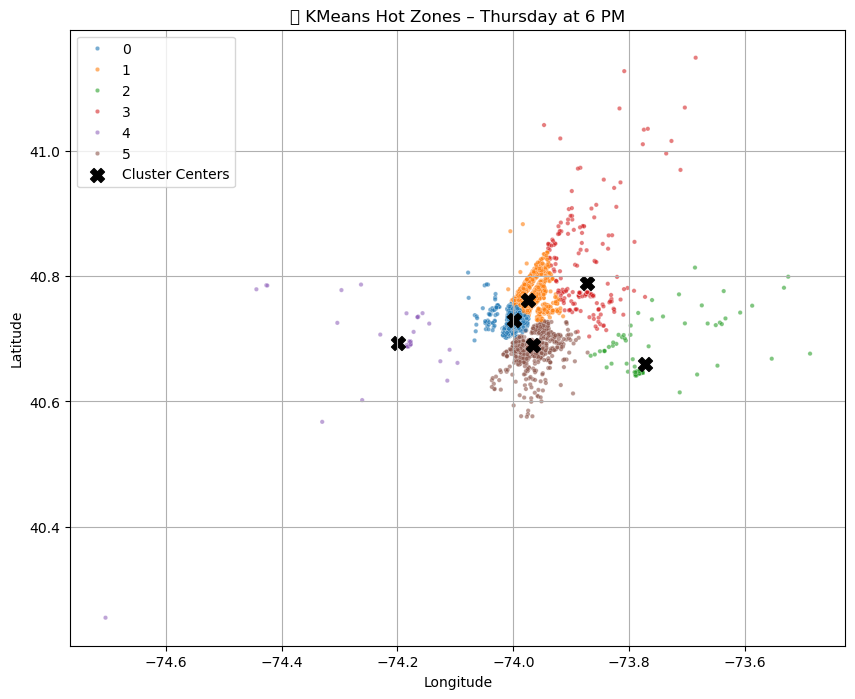

In [22]:

plt.figure(figsize=(10, 8))

# STEP 2: Plot the pickup points, colored by cluster
# Each color represents one hot zone (cluster)
sns.scatterplot(
    x='Lon', y='Lat',
    hue='cluster',
    data=subset,
    palette='tab10',
    s=10, alpha=0.6
)

plt.scatter(
    centers[:, 1],  # Longitude
    centers[:, 0],  # Latitude
    c='black', s=100, marker='X', label='Cluster Centers'
)

# STEP 4: Customize the plot
plt.title('📍 KMeans Hot Zones – Thursday at 6 PM')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)

# STEP 5: Show the plot
plt.show()


This map shows Uber pickup hotspots on Thursday at 6 PM, using KMeans.
Each color is a cluster, and the black Xs show the centers — the best spots for drivers to be.
Most clusters are around central NYC, especially Manhattan, which makes sense for this busy time.

In [23]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# STEP 1: Scale the coordinates (important for DBSCAN to work properly)
scaler = StandardScaler()
scaled_coords = scaler.fit_transform(subset[['Lat', 'Lon']])

# STEP 2: Apply DBSCAN clustering
# eps = neighborhood size, min_samples = points needed to form a dense area
dbscan = DBSCAN(eps=0.3, min_samples=20)
subset['dbscan_cluster'] = dbscan.fit_predict(scaled_coords)


/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.



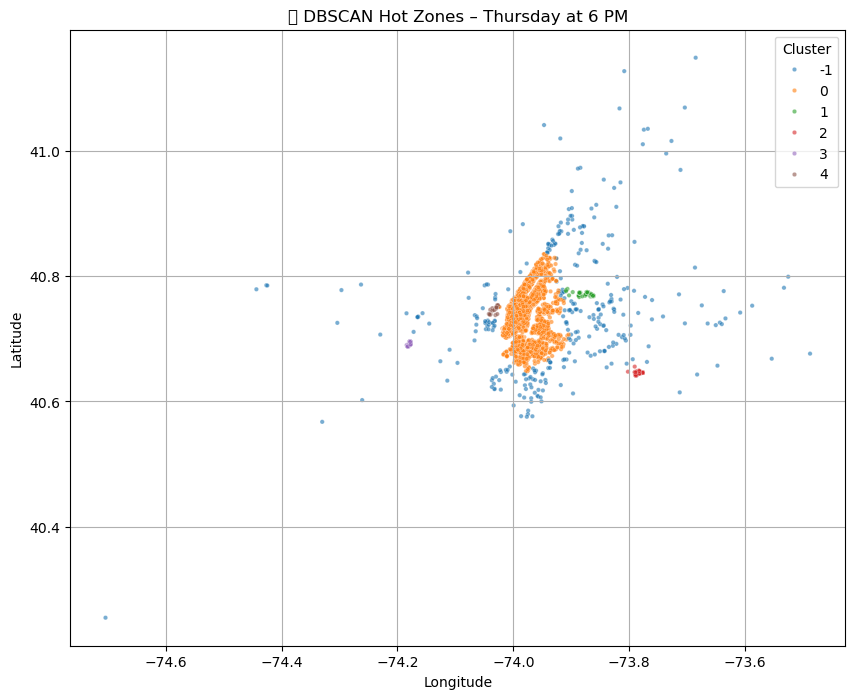

In [24]:
# STEP 1: Set up the figure
plt.figure(figsize=(10, 8))

# STEP 2: Plot the pickup points, colored by DBSCAN cluster
sns.scatterplot(
    x='Lon', y='Lat',
    hue='dbscan_cluster',
    data=subset,
    palette='tab10',
    s=10, alpha=0.6,
    legend='full'
)

# STEP 3: Customize the plot
plt.title('📍 DBSCAN Hot Zones – Thursday at 6 PM')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster', loc='best')
plt.grid(True)
plt.show()


This map shows Uber pickup hotspots on Thursday at 6 PM, using DBSCAN.
The algorithm automatically found several dense zones (clusters), mostly concentrated in central NYC.
It also marked some points as noise (label -1) — likely lower-demand areas or scattered pickups.

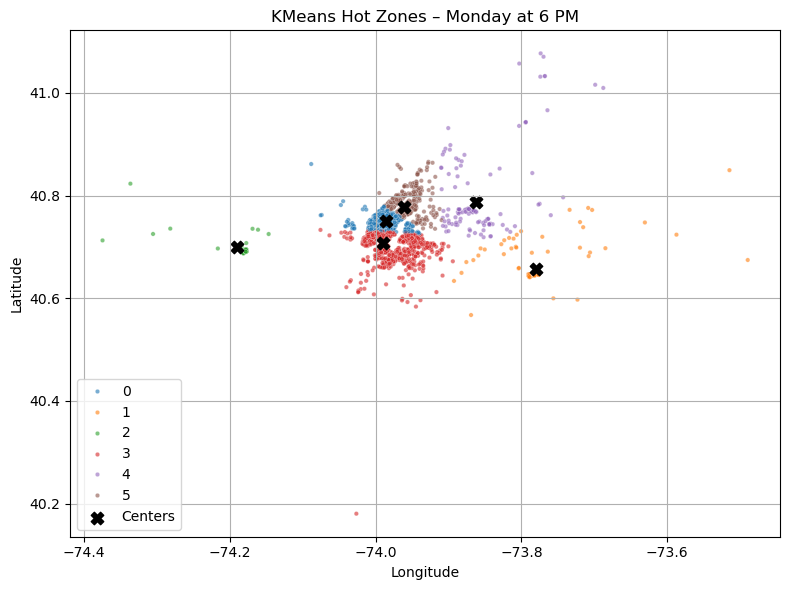

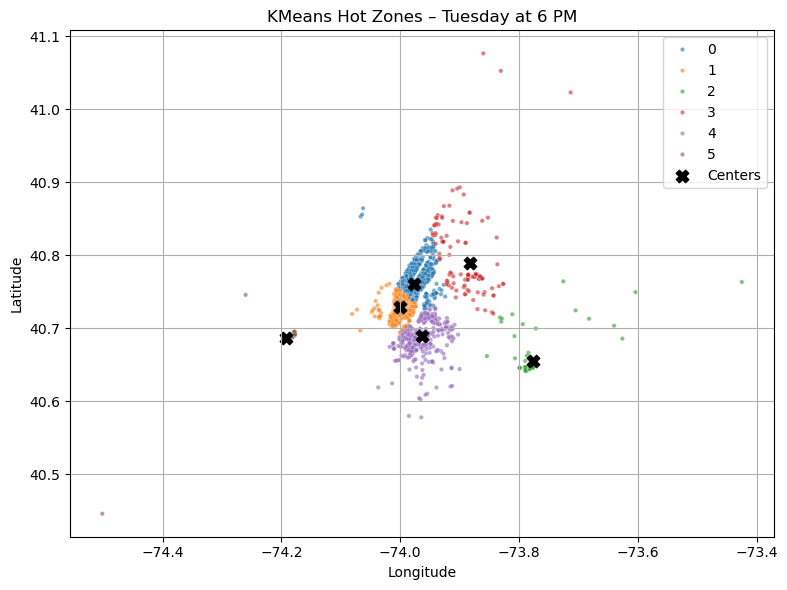

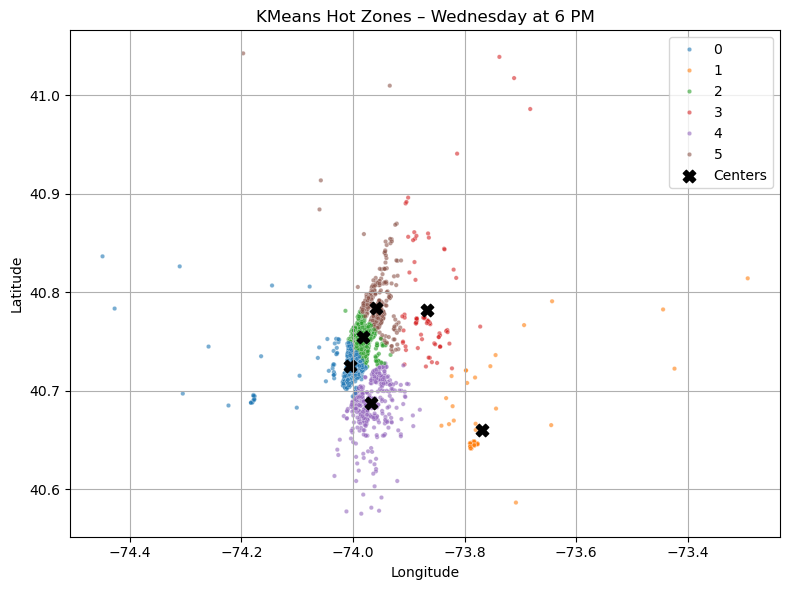

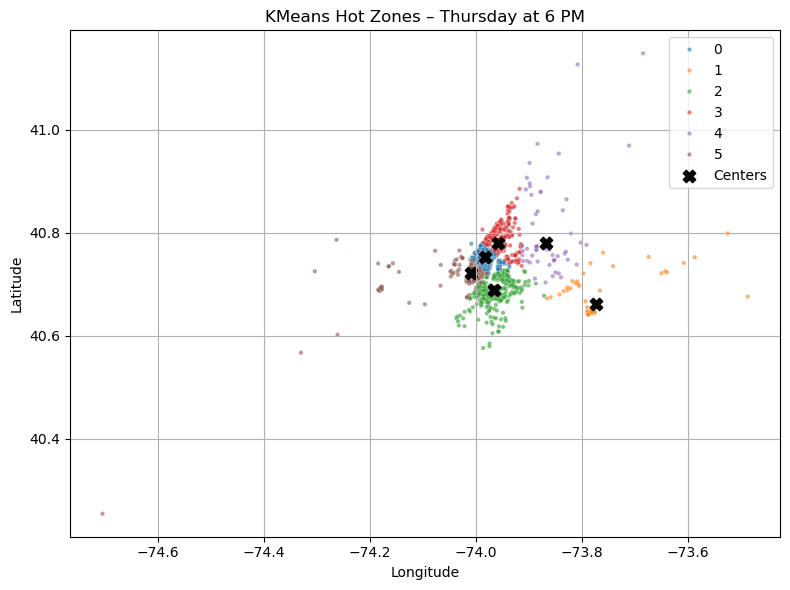

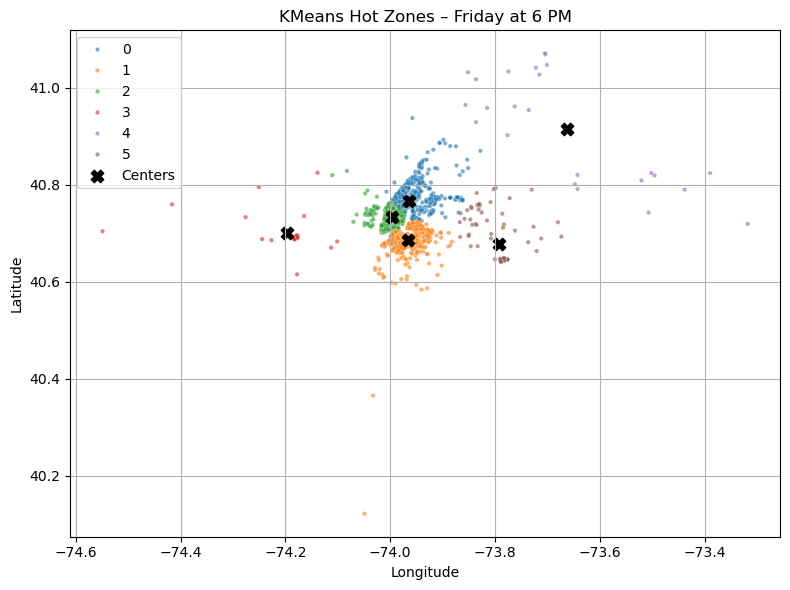

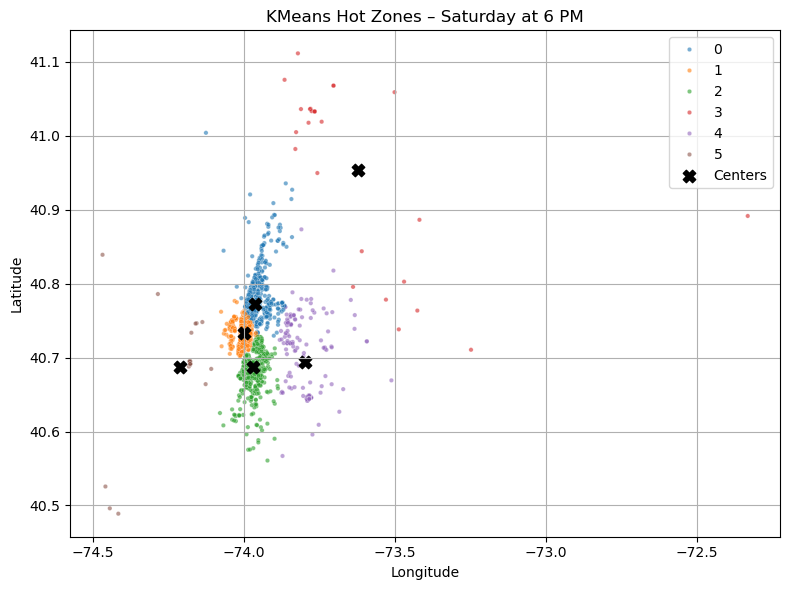

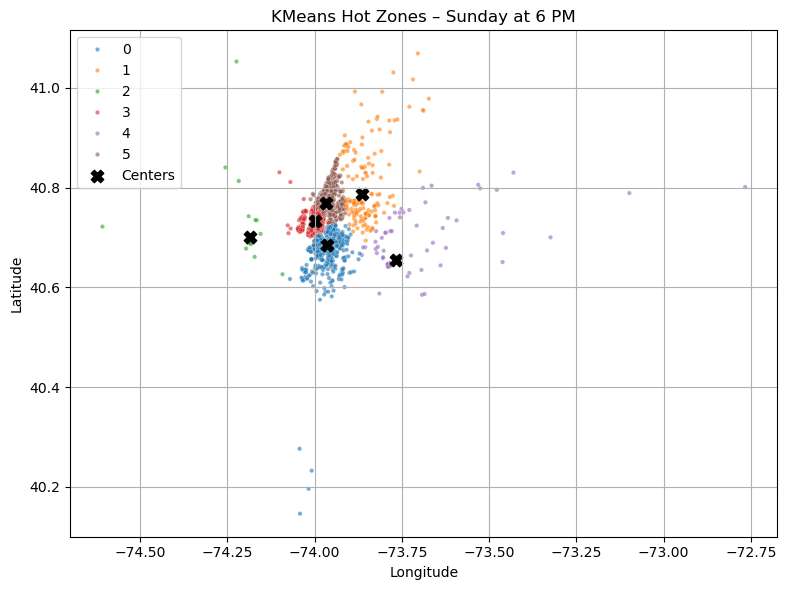

In [25]:
# Generate KMeans plots for each day at 6 PM
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for day in days:
    # Filter the data
    subset = df[(df['dayofweek'] == day) & (df['hour'] == 18)]
    subset = subset[['Lat', 'Lon']].dropna().sample(5000, random_state=42)
    
    # KMeans clustering
    kmeans = KMeans(n_clusters=6, random_state=42)
    subset['cluster'] = kmeans.fit_predict(subset)
    centers = kmeans.cluster_centers_
    
    # Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='Lon', y='Lat', hue='cluster', data=subset, palette='tab10', s=10, alpha=0.6)
    plt.scatter(centers[:, 1], centers[:, 0], c='black', s=80, marker='X', label='Centers')
    plt.title(f'KMeans Hot Zones – {day} at 6 PM')
    plt.xlabel('Longitude'); plt.ylabel('Latitude')
    plt.legend(); plt.grid(True)
    plt.tight_layout()
    plt.show()


KMeans Hot Zones at 6 PM (Daily View)
These maps show where most Uber pickups happen at 6 PM for each day of the week.

In every map, we see that central Manhattan stays a busy area — it’s the main hotspot.

On weekends, especially Saturday and Sunday, the clusters are more spread out, probably because people go out more or travel further.

During the week, the pickup zones are more focused, likely from work-related rides

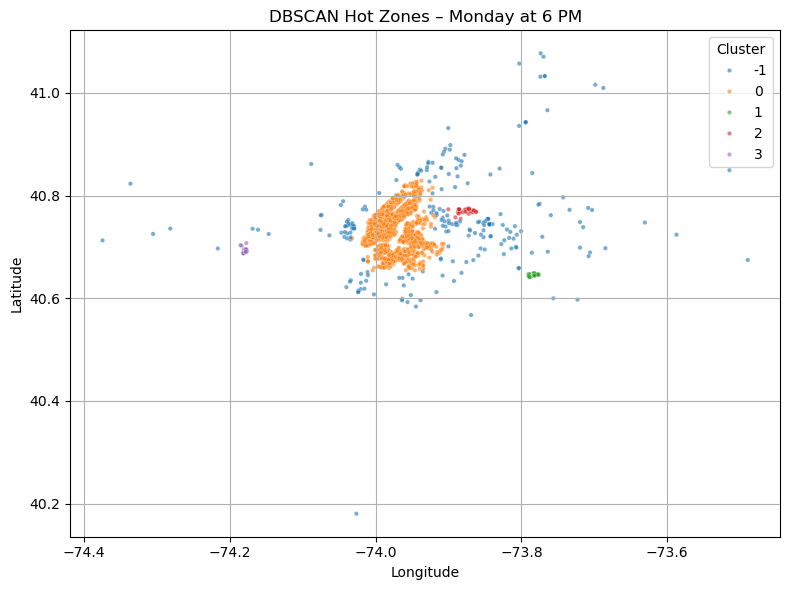

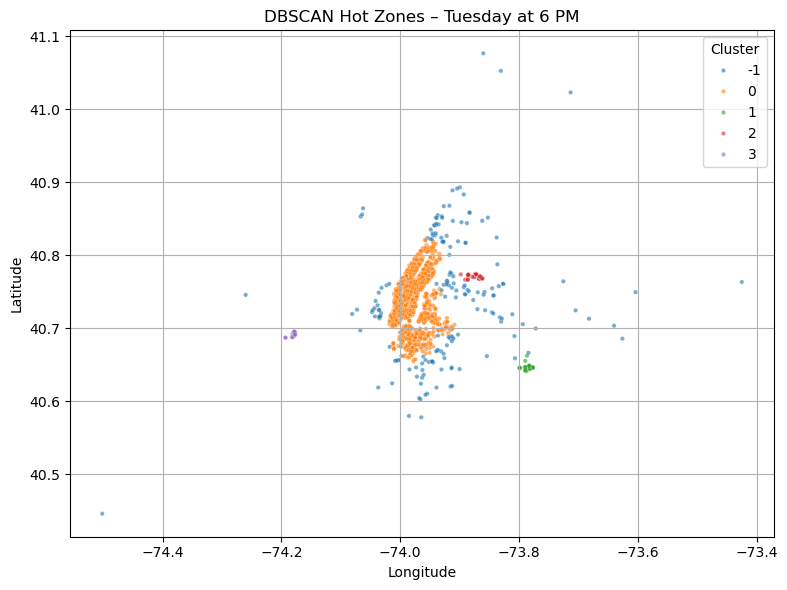

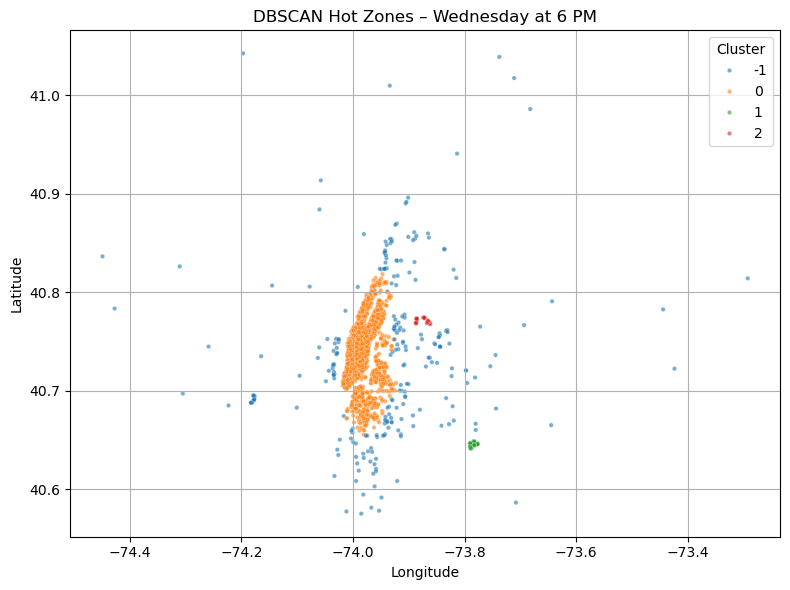

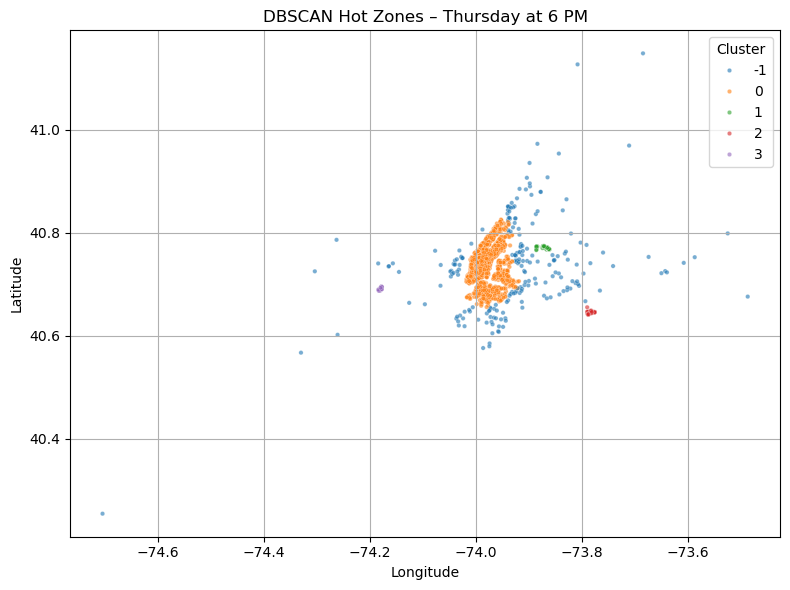

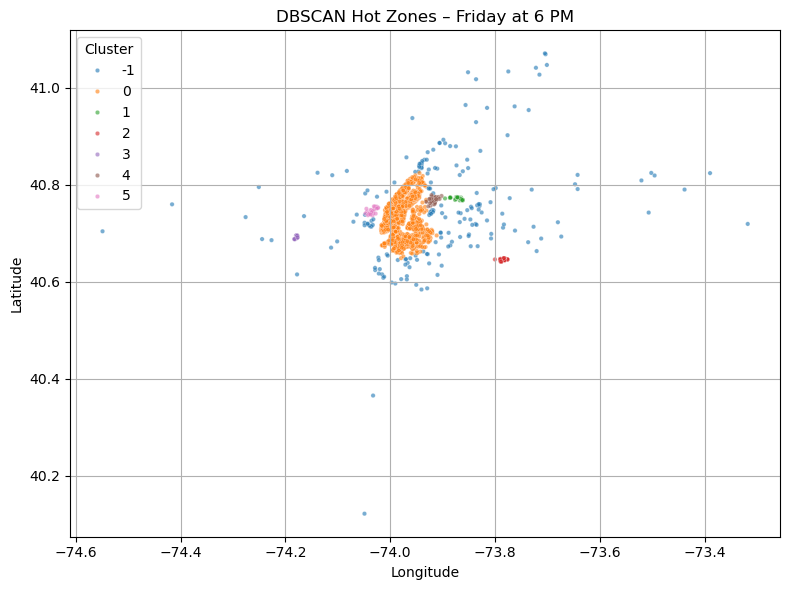

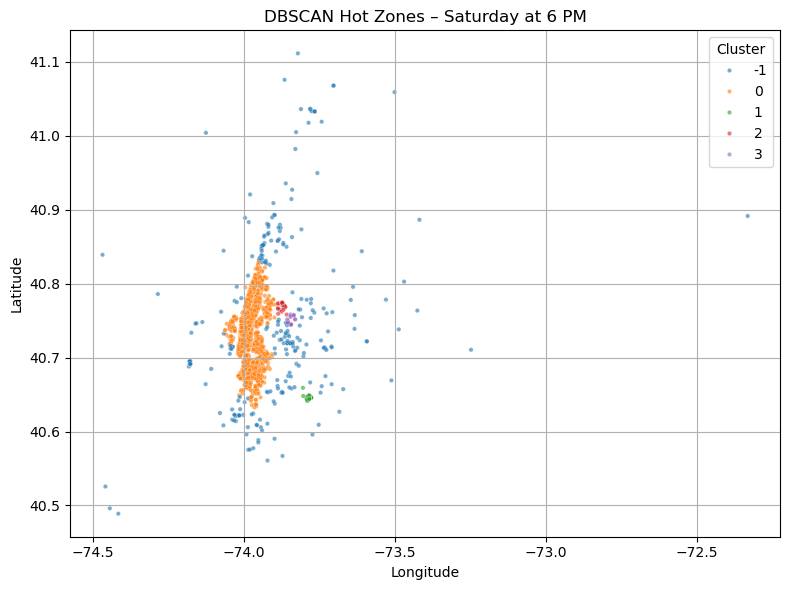

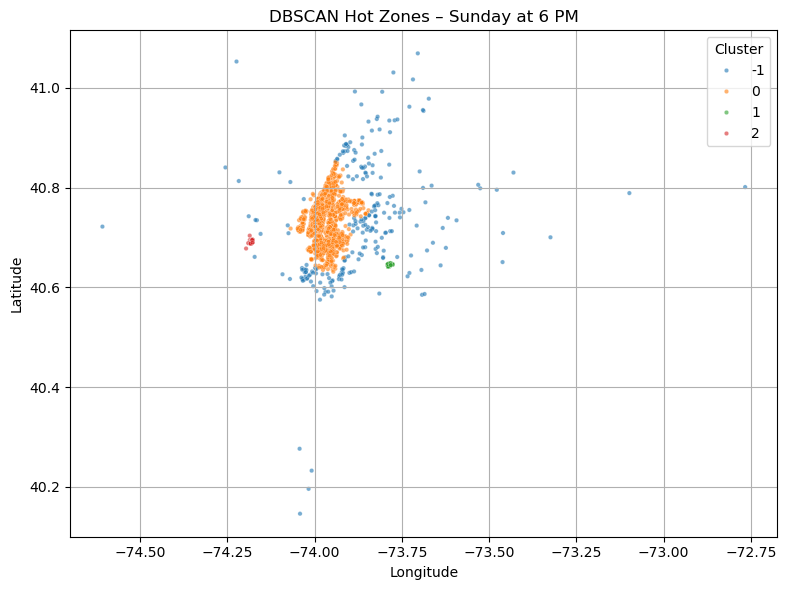

In [26]:
#DBSCAN Clustering Per Day 

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for day in days:
    # STEP 1: Filter data for this day at 6 PM
    subset = df[(df['dayofweek'] == day) & (df['hour'] == 18)]
    subset = subset[['Lat', 'Lon']].dropna()
    
    if len(subset) < 200:  # Skip if not enough data
        continue
    
    subset = subset.sample(min(5000, len(subset)), random_state=42)
    
    # STEP 2: Scale coordinates for DBSCAN
    scaler = StandardScaler()
    scaled_coords = scaler.fit_transform(subset[['Lat', 'Lon']])
    
    # STEP 3: Apply DBSCAN
    dbscan = DBSCAN(eps=0.3, min_samples=20)
    subset['cluster'] = dbscan.fit_predict(scaled_coords)
    
    # STEP 4: Plot the result
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='Lon', y='Lat', hue='cluster', data=subset, palette='tab10', s=10, alpha=0.6)
    plt.title(f'DBSCAN Hot Zones – {day} at 6 PM')
    plt.xlabel('Longitude'); plt.ylabel('Latitude')
    plt.legend(title='Cluster', loc='best')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


DBSCAN Hot Zones at 6 PM (All Days)
These maps show Uber pickup clusters at 6 PM for each day of the week using DBSCAN.

The biggest and most dense cluster (orange) appears almost every day around central Manhattan — it’s the main hotspot.

Other small clusters also appear in different parts of NYC, but they’re more spread out and less consistent.

Points in grey (label -1) are noise — DBSCAN didn’t group them into any cluster, usually because they’re far from others.

In [27]:
#Apply K-Means Clustering for the entire dataset

# First we use  he Elbow Method to find the optimal number of clusters.
#This is geographic data, we skip preprocessing and go directly to clustering. We’ll apply K-Means and DBSCAN to find hot-zones for Uber pickups.


# Extract longitude & latitude
X = df[['Lon', 'Lat']]

# Try different K values

wcss = []
k = []


for i in range (1, 11):
    kmeans = KMeans(n_clusters= i, random_state=0, n_init= 'auto')
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
    k.append(i)


print("wcss for K={} --> {}".format(i, wcss[-1]))


wcss for K=10 --> 3280.8474908389535


WCSS stands for Within-Cluster Sum of Squares. It measures:  How close the points in each cluster are to the center of that cluster.
wcss for K=10 → 3280.85
It means: when we ask KMeans to form 10 clusters, the total "distance error" (how far points are from their cluster center) is about 3280.
As K increases: Each cluster becomes smaller, WCSS usually drops.

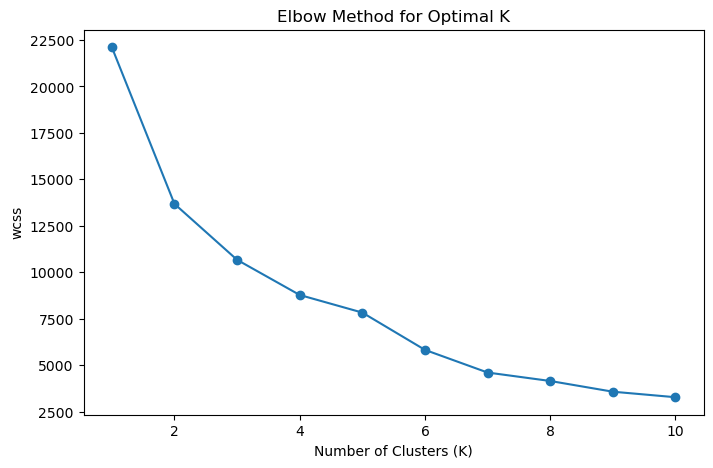

In [28]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('wcss')
plt.title('Elbow Method for Optimal K')
plt.show()

The "elbow" appears around K = 4 or 5, meaning that choosing 4 or 5 clusters would be a good balance for segmenting the data effectively.

In [29]:
# try silhouette method to confirm the number of cluster K 
#taking a random sample to speed up computation

sample = df[['Lon', 'Lat']].sample(10000, random_state=42)  

In [30]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


# Silhouette Score doesn’t cluster the data — it just evaluates how well the clustering already done fits.
scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(sample)
    score = silhouette_score(sample, labels)
    scores.append(score)


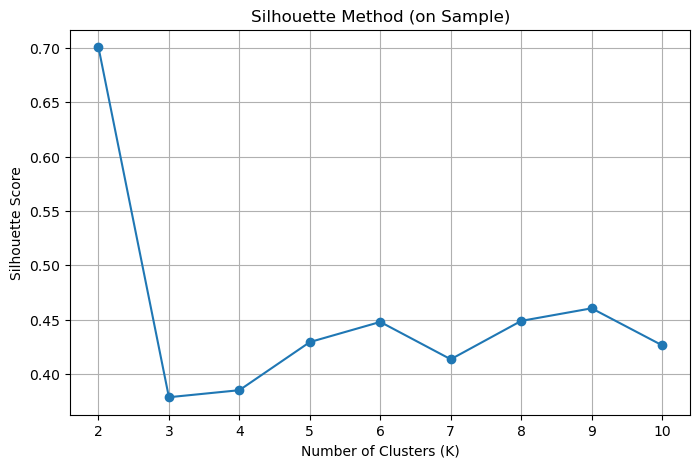

In [31]:
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), scores, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method (on Sample)')
plt.grid(True)
plt.show()


This chart shows how good each K value is using the silhouette score.
The score tells us how well the points fit inside their clusters — the higher, the better.
K = 2 has the best score, but it's too simple for a big city like NYC.
The best balance seems to be around K = 6 or 9, where we have decent scores and more detailed zones

In [32]:
# Try clustering with k = 6 and K = 9

# Step 1: Prepare coordinate data
X = df[['Lon', 'Lat']]

# Step 2: Run KMeans on the full dataset with 6 clusters
kmeans = KMeans(n_clusters=6, init='k-means++', max_iter=300, random_state=0)
df['kmeans_clusters'] = kmeans.fit_predict(X) + 1  # Start clusters from 1 instead of 0

# Step 3: Take a smaller sample for plotting only (30,000 points)
plot_sample = df.sample(30000, random_state=42)

# Step 4: Plot the clusters on a map using Plotly
fig = px.scatter_mapbox(
    plot_sample,
    lat='Lat', lon='Lon',
    color='kmeans_clusters',
    zoom=10,
    mapbox_style="carto-positron",
    width=1000, height=700,
    title='KMeans Clusters in NYC (K=6)'  
)

# Step 5: Show the map (reliable in notebook)
fig.show(renderer="notebook")


🗺️ Uber Pickup Zones in NYC (K=6)
This map shows how Uber pickups in New York City naturally group into 6 main zones.
Each color shows a different area where ride demand is similar.
we clearly see central Manhattan as a major hotspot, along with Brooklyn, Queens, and some areas in New Jersey.
The KMeans algorithm helped us spot these zones based on the location of thousands of rides.

In [33]:
#let's go further  k=9 to see if we will find a better result. 
X = df[['Lon', 'Lat']]
kmeans = KMeans(n_clusters=9, max_iter=300, random_state=0)
df['kmeans_clusters'] = kmeans.fit_predict(X) + 1  # Start clusters from 1


In [34]:

city_labels = pd.DataFrame({
    'City': ['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Newark', 'Jersey City'],
    'Lat': [40.78, 40.68, 40.73, 40.85, 40.74, 40.72],
    'Lon': [-73.97, -73.94, -73.79, -73.87, -74.17, -74.04]
})

In [35]:
import plotly.express as px

sample = df.sample(50000, random_state=1)

fig = px.scatter_mapbox(sample, lat='Lat', lon='Lon', color='kmeans_clusters',
                        zoom=10, mapbox_style='carto-positron', height=700, title='KMeans Clusters in NYC (K=9)')


# Add city name labels
fig.add_scattermapbox(lat=city_labels['Lat'], lon=city_labels['Lon'],
                      mode='text', text=city_labels['City'],
                      textfont=dict(size=14, color='black'),
                      showlegend=False)

fig.show(renderer="notebook")


This map shows how Uber pickups in NYC naturally group into 9 distinct zones, based on geographic patterns.

Each color represents a different cluster found by the KMeans algorithm, helping us visualize areas with similar ride demand.

We can clearly see dense activity in Manhattan, Brooklyn, Queens, and Jersey City.

Areas like The Bronx and Newark also stand out as separate clusters.

These clusters reflect both population density and commuting habits across the city.

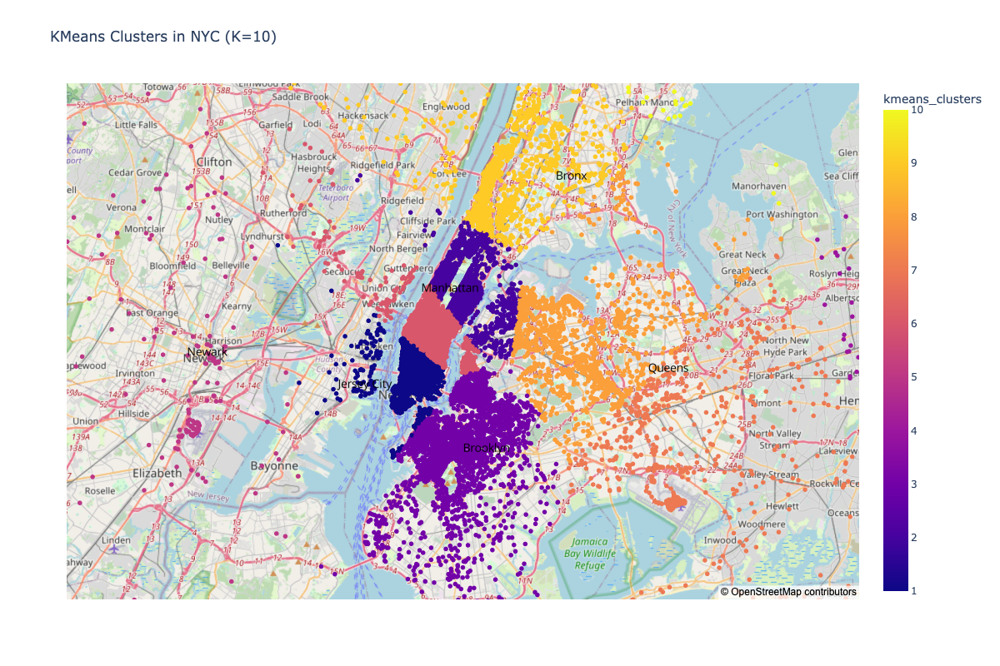

In [36]:


# KMeans clustering
kmeans = KMeans(n_clusters=10, max_iter=300, random_state=0)
kmeans.fit(X)
df['kmeans_clusters'] = kmeans.labels_ + 1  # Shift clusters from 0 to 1

# Sample for visualization
kmeans_sample = df.sample(n=50000, weights='kmeans_clusters', random_state=1)

# City name coordinates
city_labels = pd.DataFrame({
    'City': ['Manhattan', 'Brooklyn', 'Queens', 'Bronx', 'Newark', 'Jersey City'],
    'Lat': [40.78, 40.68, 40.73, 40.85, 40.74, 40.72],
    'Lon': [-73.97, -73.94, -73.79, -73.87, -74.17, -74.04]
})

# Create the map
fig = px.scatter_mapbox(
    kmeans_sample, lat='Lat', lon='Lon', color='kmeans_clusters',
    zoom=10, mapbox_style="carto-positron", width=1200, height=800,
    title='KMeans Clusters in NYC (K=10)'
)

# Add city name annotations
fig.add_scattermapbox(
    lat=city_labels['Lat'],
    lon=city_labels['Lon'],
    mode='text',
    text=city_labels['City'],
    textfont=dict(size=14, color='black'),
    showlegend=False
)

# Optional: switch to OpenStreetMap style
fig.update_layout(mapbox_style="open-street-map")

fig.show()


KMeans Clusters in NYC (K=10)
This map shows Uber pickups grouped into 10 clusters across NYC and surrounding areas.

🔷 Manhattan is clearly divided into three major zones:
• Dark blue: Midtown — a dense hub of activity
• Red: Lower Manhattan — a business & tourist hotspot
• Dark purple: Upper West Side & Harlem — distinct from Midtown

🟣 Brooklyn and Queens also show natural splits:
• Purple: Covers much of Brooklyn’s residential and mixed-use zones
• Orange: Bridges Brooklyn and Queens, possibly transit-heavy areas
• Yellow: Northern Queens and outer boroughs with lower density

🌍 Beyond NYC, the pink cluster covers Newark and outlying suburbs, highlighting occasional but distinct ride demand.

➕ Overall, using K=10 gives finer detail than K=6 or 9

## Conclusion:
After testing multiple cluster sizes, K=10 provides the most informative segmentation of Uber pickups across NYC.
It offers granular insights in key zones like Manhattan, Brooklyn, and Queens, while also highlighting less dense areas like Newark.
This level of clustering is well-suited for operational decisions, such as optimizing driver distribution, identifying high-demand pockets, or adjusting surge pricing by neighborhood.

In [37]:
#let's try DBSCAN to handel with outliers and noise 


# Step 1: Sample data for performance (DBSCAN is slower than KMeans)
sample_dbscan = df[['Lon', 'Lat']].sample(50000, random_state=42)

# Step 2: Apply DBSCAN
dbscan = DBSCAN(eps=0.01, min_samples=10)
sample_dbscan['dbscan_cluster'] = dbscan.fit_predict(sample_dbscan)

# Step 3: Copy coordinates back for plotting
sample_dbscan['Lat'] = sample_dbscan['Lat']
sample_dbscan['Lon'] = sample_dbscan['Lon']

# Step 4: Plot with Plotly
fig = px.scatter_mapbox(
    sample_dbscan,
    lat='Lat', lon='Lon',
    color='dbscan_cluster',
    zoom=10,
    mapbox_style='carto-positron',
    height=700,
    title='DBSCAN Clusters in NYC (Sample of 50,000)'
)

fig.show(renderer="notebook")


The large purple zone in Manhattan confirms it as the biggest hotspot for Uber pickups. These clusters reflect areas with high and consistent ride demand.

Other clear clusters appear in: Brooklyn and Queens, Jersey City, Newark... The blue dots (label -1) are noise points — isolated pickups that don’t belong to any group.

The presence of noise (blue dots) shows where pickups are more scattered and less frequent

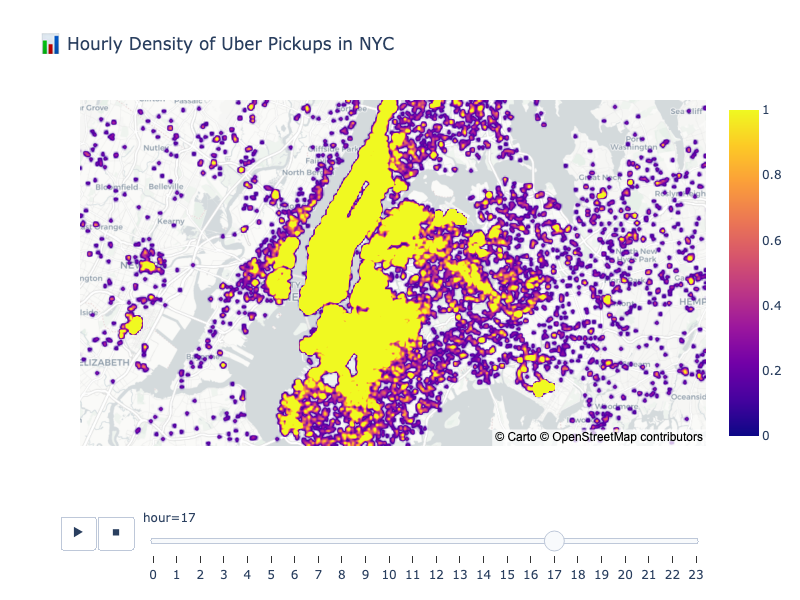

In [ ]:
# Hour density for Uber pick up

# Make sure hour is an integer and sorted
df['hour'] = df['Date/Time'].dt.hour.astype(int)
df = df.sort_values(by='hour')

fig = px.density_mapbox(
    df,
    lat='lat',
    lon='lon',
    radius=3,  
    mapbox_style='carto-positron',
    animation_frame='hour',
    width=800,
    height=600,
    title='📊 Hourly Density of Uber Pickups in NYC',
    zoom=9.5,
    center=dict(lat=40.73, lon=-73.93)
)

#  Set default hour 
default_hour = 17
fig.layout.sliders[0].active = default_hour
fig = go.Figure(data=fig.frames[default_hour].data, frames=fig.frames, layout=fig.layout)

fig.show()



## 📌 5. Conclusion 

In conclusion, this study effectively identified major Uber pickup hot zones across NYC, with Manhattan, Brooklyn, and Queens emerging as the most active areas. KMeans clustering helped us detect well-defined pickup clusters, while DBSCAN validated these zones and filtered out sparse noise. The use of interactive Plotly maps allowed us to visualize pickup densities hour by hour. We observed that demand peaks between 3 PM and 10 PM on weekdays—especially Thursdays—with Manhattan consistently showing the highest activity, segmented into Midtown, Lower, and Uptown. On weekends, demand spreads more widely, notably across Brooklyn and Queens. Based on these findings, we recommend that Uber increase driver availability in Manhattan during peak evening hours and explore the use of clustering insights to trigger real-time alerts in high-demand zones. Further enhancements could include integrating traffic, weather.